In [2]:
import torch
from sklearn.model_selection import train_test_split

# load data from data folder(we"re in notebooks folder)
sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')

# train test split
train_data, test_data = train_test_split(
    sim_arr_tensor, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(
    train_data, test_size=0.2, random_state=42)

/tmp/ipykernel_2253384/1126774367.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')


In [3]:
from torch import nn

num_layers = 5
poolsize = [2, 2, 2, 2, 5]
channels = [3, 12, 7, 7, 11, 12]
kernel_sizes = [15, 10, 14, 14, 14]
dilations = [5, 5, 3, 3, 1]
activations = [nn.SiLU, nn.Tanh, nn.Softplus, nn.SiLU, nn.SiLU]
learning_rate = 0.0002568457560593339
batch_size = 32
epochs = 400

/home/tummalas/hyper-param-optim-4-vector-field-clustering/models/train_cluster.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sim_arr_tensor = torch.load('./data/sim_

Epoch 1/400
              Train Loss: 138126.8676
              Val Loss: 128385.7869
Epoch 2/400
              Train Loss: 132546.1884
              Val Loss: 118722.9628
Epoch 3/400
              Train Loss: 112639.4329
              Val Loss: 102648.5043
Epoch 4/400
              Train Loss: 105000.7717
              Val Loss: 98321.2279
Epoch 5/400
              Train Loss: 95849.7965
              Val Loss: 77477.5413
Epoch 6/400
              Train Loss: 68085.6626
              Val Loss: 51621.5711
Epoch 7/400
              Train Loss: 50736.6230
              Val Loss: 44892.6608
Epoch 8/400
              Train Loss: 45810.6362
              Val Loss: 41868.0091
Epoch 9/400
              Train Loss: 43055.7103
              Val Loss: 38701.4036
Epoch 10/400
              Train Loss: 40223.9401
              Val Loss: 35638.5096
Epoch 11/400
              Train Loss: 37006.7117
              Val Loss: 32712.7464
Epoch 12/400
              Train Loss: 34597.0679
              Val

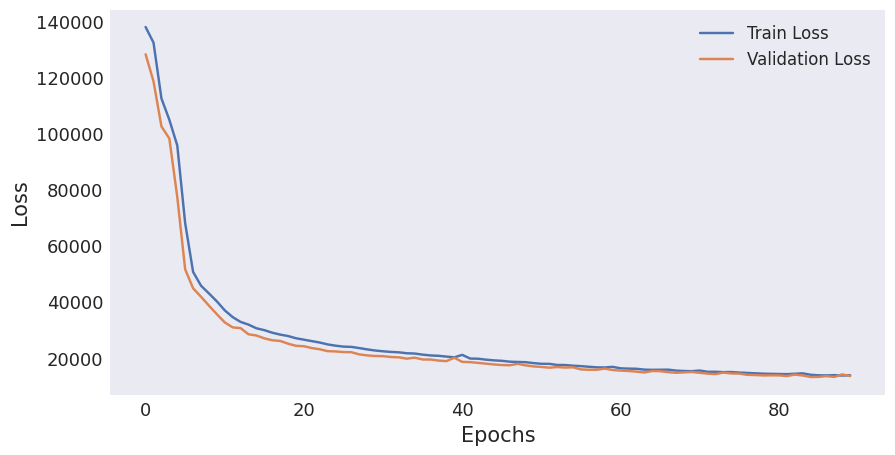

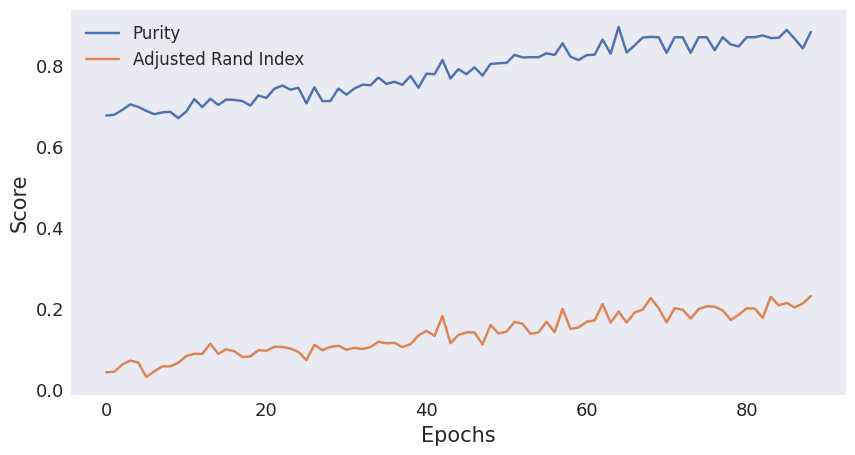

In [3]:
from models import vanilla
from models import train_cluster, evaluate

encoder = vanilla.Encoder(num_layers, poolsize, channels,
                          kernel_sizes, dilations, activations)
decoder = vanilla.Decoder(encoder)
model = vanilla.AutoEncoder(encoder, decoder)

train_cluster(model, train_data, val_data,
      lr=learning_rate,
      batch_size=batch_size,
      epochs=epochs)

# model = torch.load('./saved_models/vanilla_model.pt')
# evaluate(model, test_data, batch_size=batch_size)

torch.save(model, './saved_models/vanilla_model.pt')

In [7]:
import optuna
from sklearn.cluster import HDBSCAN
from cluster_acc import purity, adj_rand_index

feature_array = model.feature_array(sim_arr_tensor)

def objective(trial):
    hdbscan_model = HDBSCAN(min_cluster_size=trial.suggest_int('min_cluster_size', 2, 10),
                            min_samples=trial.suggest_int('min_samples', 1, 1000),
                            cluster_selection_epsilon=trial.suggest_float('cluster_selection_epsilon', 0.0, 1.0),
                            allow_single_cluster=False)
    hdbscan_model.fit(feature_array)
    labels = hdbscan_model.labels_
    return adj_rand_index(labels)
    
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

print(study.best_params)

hdbscan_model = HDBSCAN(min_cluster_size=study.best_params['min_cluster_size'],
                        min_samples=study.best_params['min_samples'],
                        cluster_selection_epsilon=study.best_params['cluster_selection_epsilon'],
                        allow_single_cluster=False)
hdbscan_model.fit(feature_array)
labels = hdbscan_model.labels_
print(f'Purity: {purity(labels)}')
print(f'ARI: {adj_rand_index(labels)}')

[I 2024-08-15 14:18:29,644] A new study created in memory with name: no-name-9e6e883b-13d6-4926-8cf4-18d912a7772e
[I 2024-08-15 14:18:30,149] Trial 0 finished with value: 0.0 and parameters: {'min_cluster_size': 8, 'min_samples': 982, 'cluster_selection_epsilon': 0.2992239077516481}. Best is trial 0 with value: 0.0.
[I 2024-08-15 14:18:30,432] Trial 1 finished with value: 0.12478198120812166 and parameters: {'min_cluster_size': 3, 'min_samples': 467, 'cluster_selection_epsilon': 0.10261475375443152}. Best is trial 1 with value: 0.12478198120812166.
[I 2024-08-15 14:18:30,933] Trial 2 finished with value: 0.0 and parameters: {'min_cluster_size': 10, 'min_samples': 992, 'cluster_selection_epsilon': 0.7382306167005716}. Best is trial 1 with value: 0.12478198120812166.
[I 2024-08-15 14:18:31,281] Trial 3 finished with value: 0.0 and parameters: {'min_cluster_size': 4, 'min_samples': 642, 'cluster_selection_epsilon': 0.32146350122216105}. Best is trial 1 with value: 0.12478198120812166.
[I 

{'min_cluster_size': 7, 'min_samples': 6, 'cluster_selection_epsilon': 0.6309926306822192}
Purity: 0.9843853820598006
ARI: 0.9703877274008056


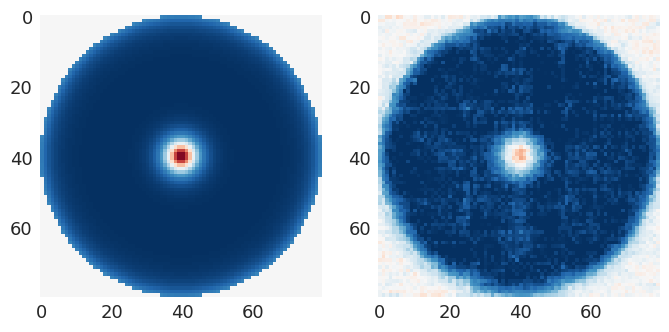

1_skyrmion


In [8]:
from plot import random_recon
random_recon(model, sim_arr_tensor)

/home/tummalas/hyper-param-optim-4-vector-field-clustering/.venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


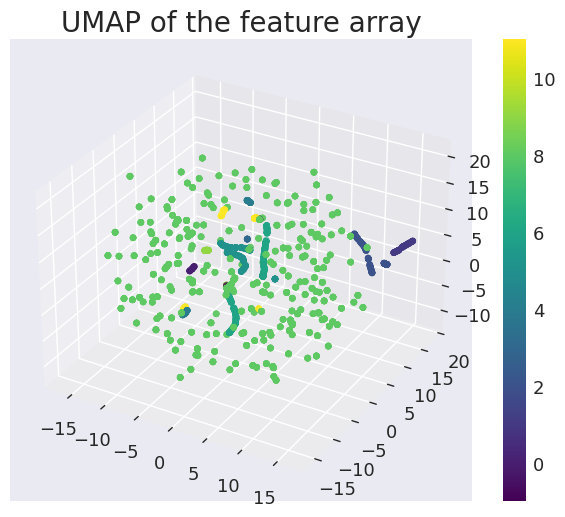

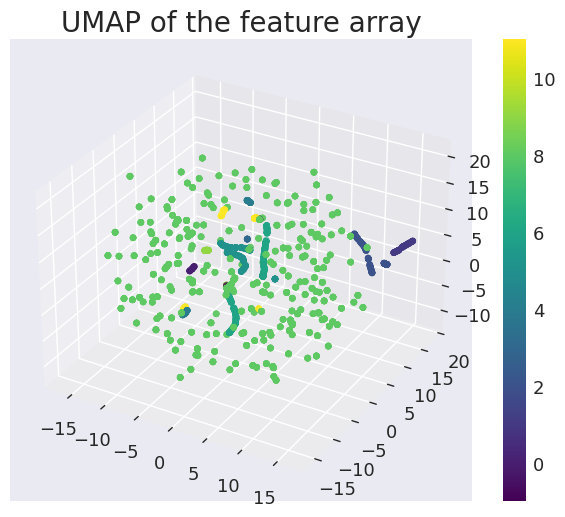

In [9]:
from plot import umap_plot
umap_plot(feature_array, labels)

In [10]:
from plot import class_config
class_config(labels)

Number of classes:  12


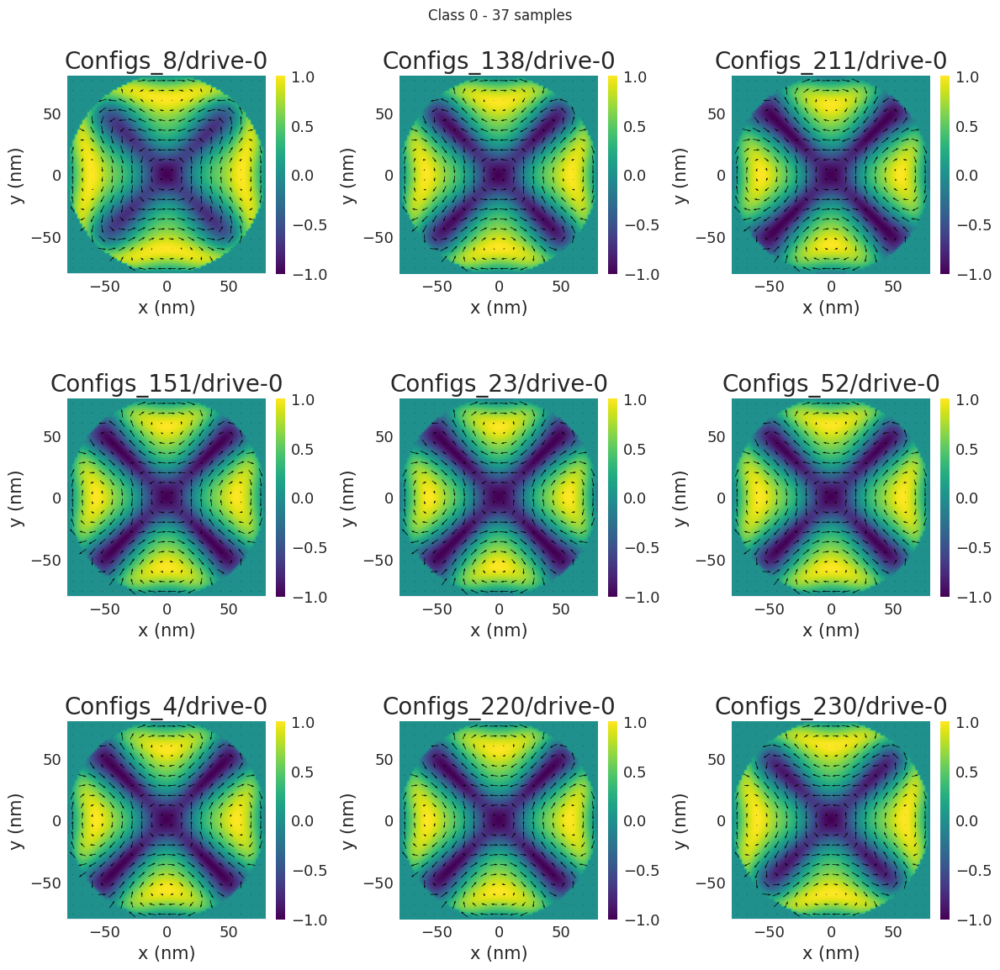

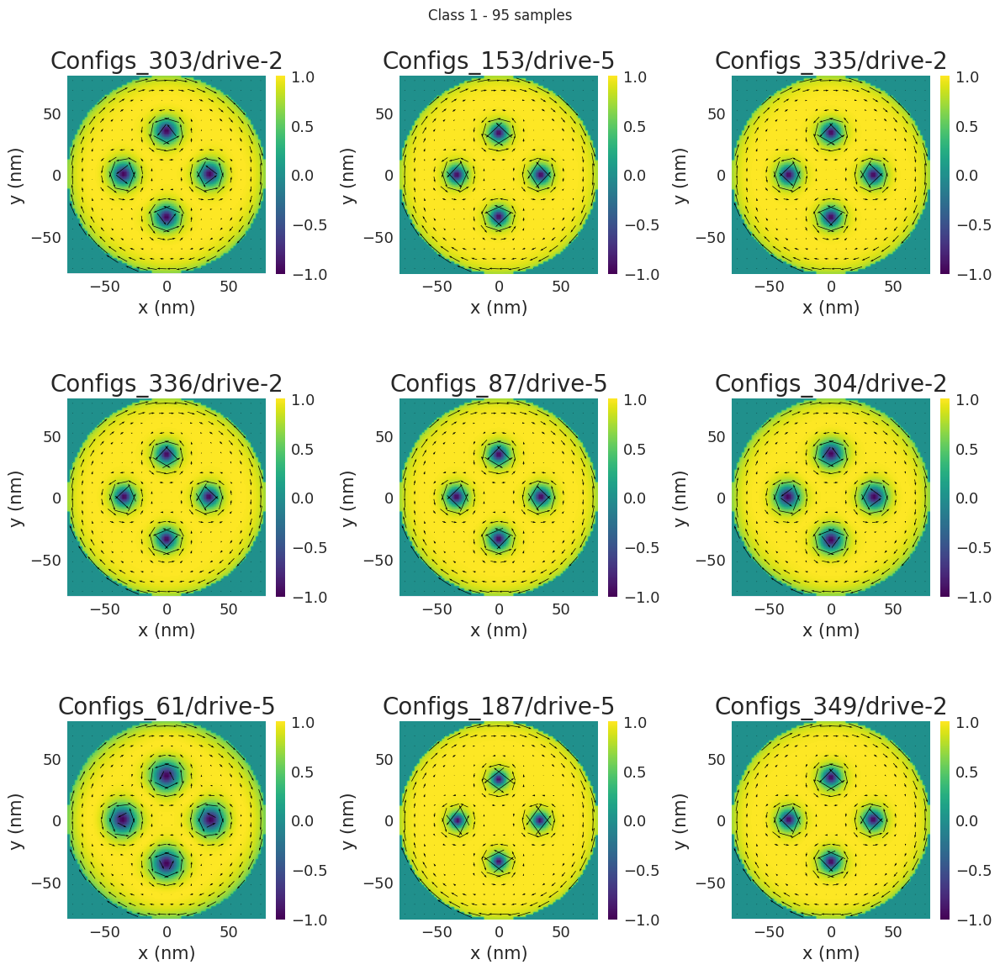

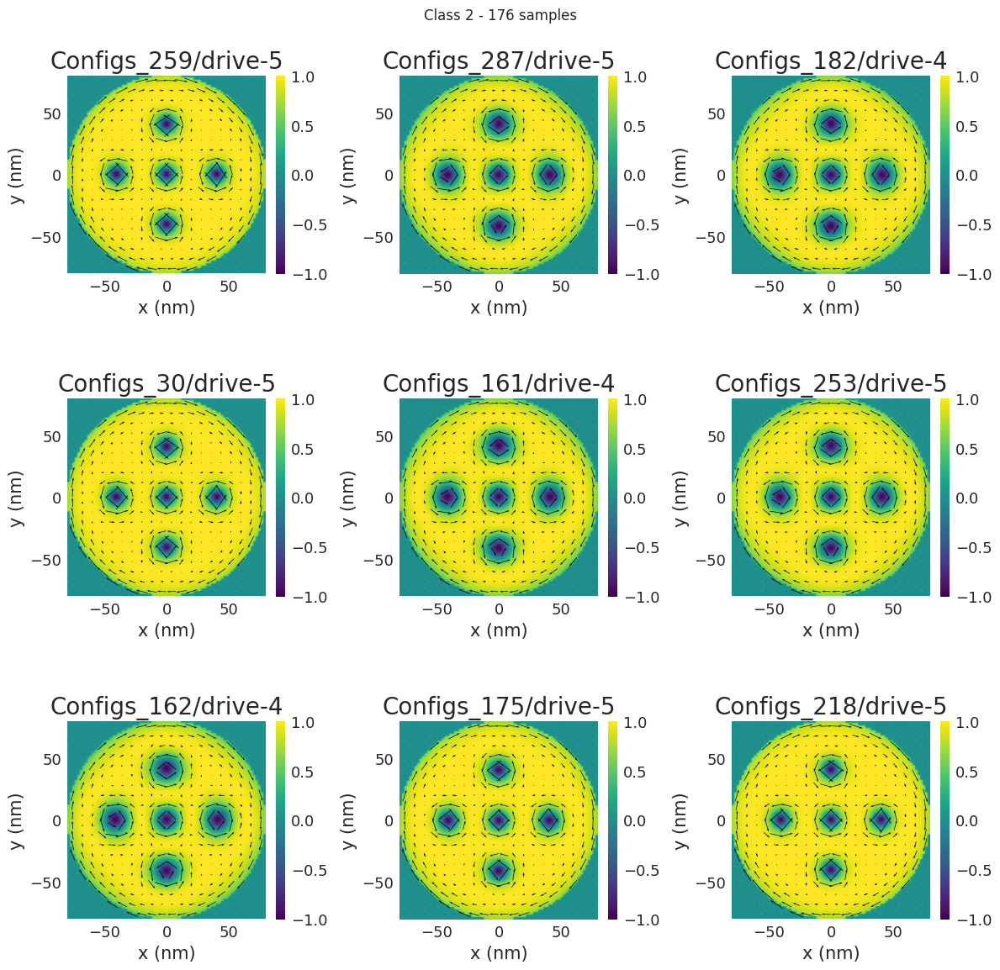

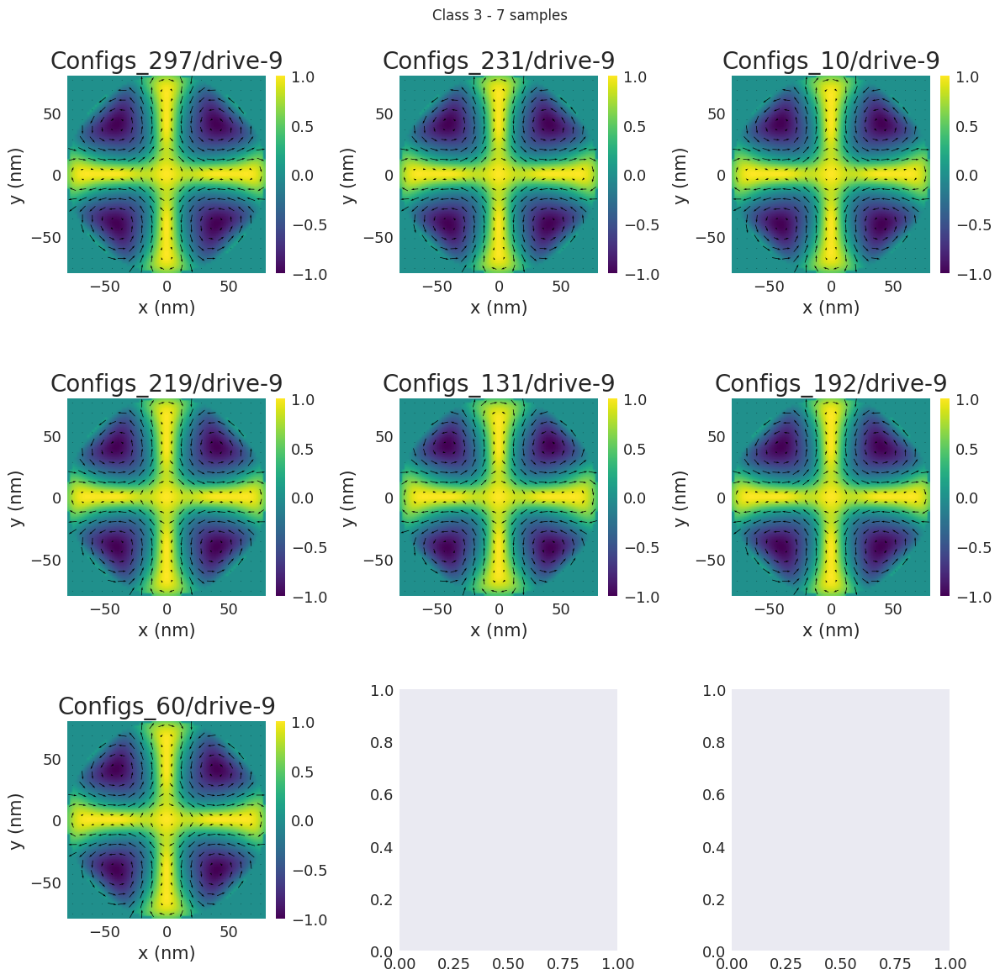

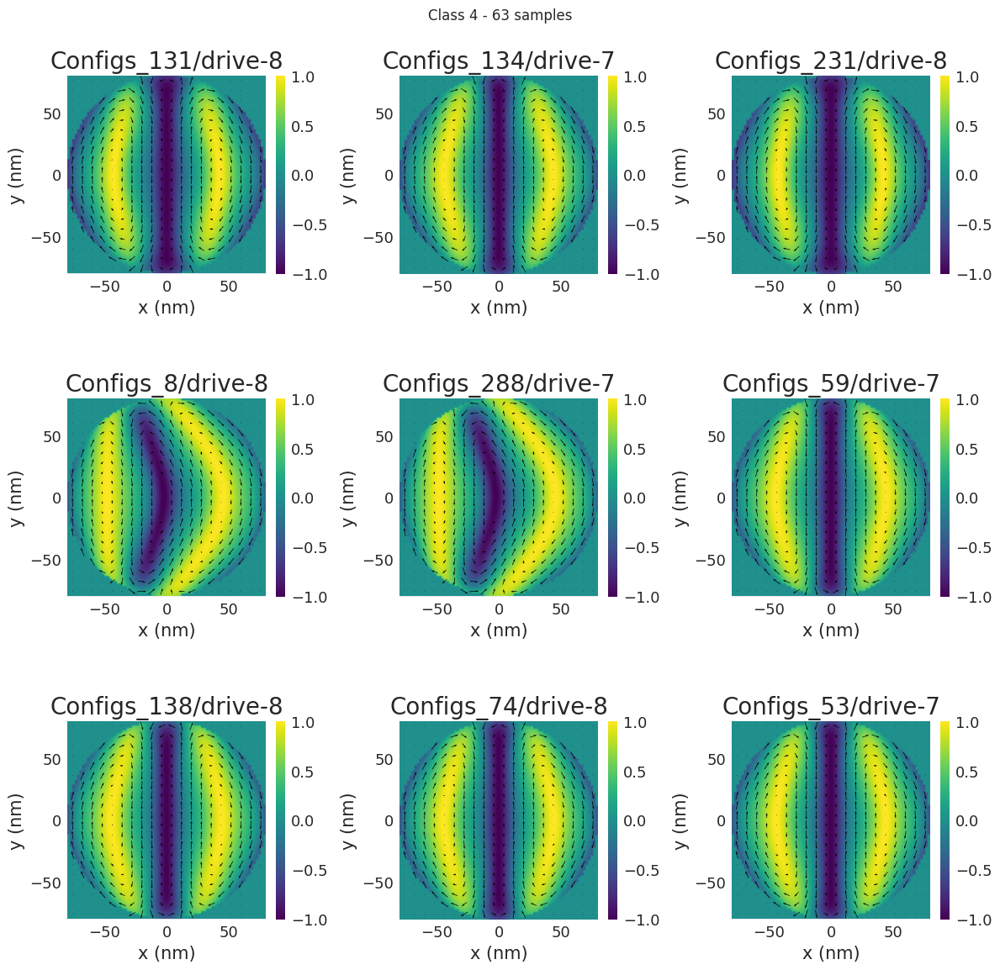

...

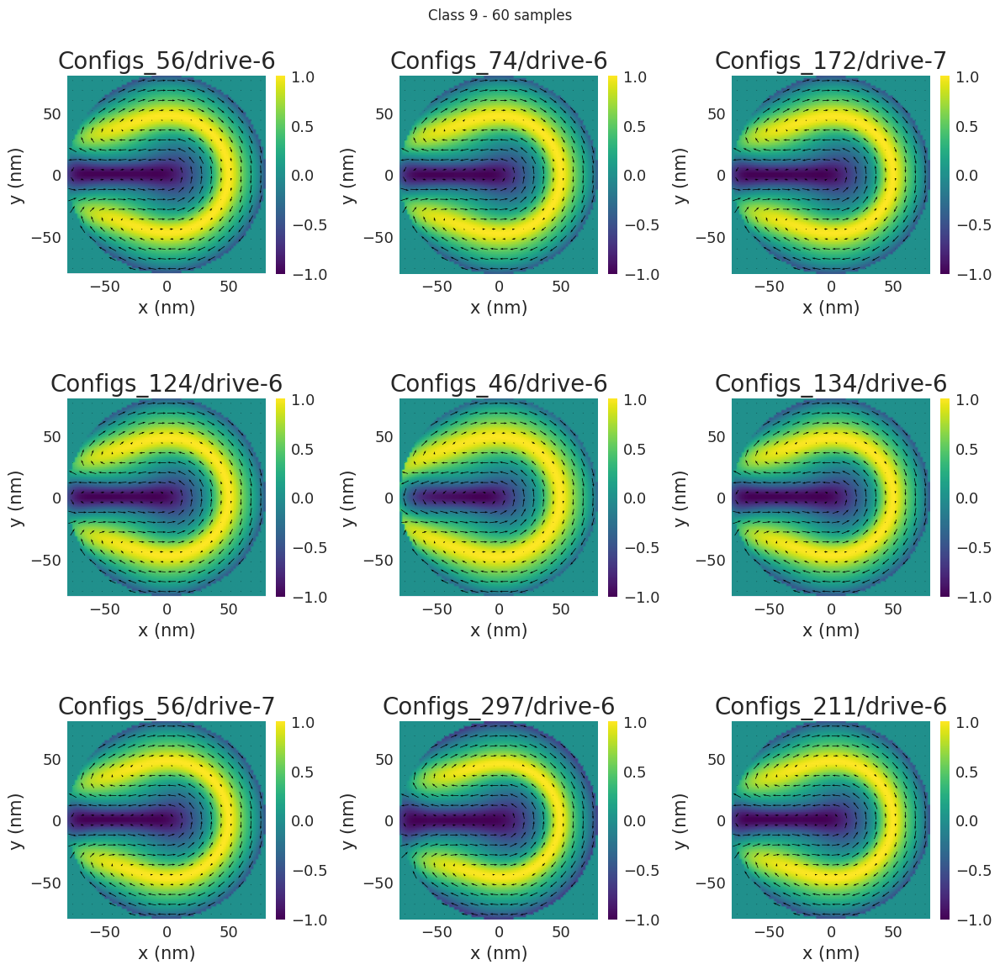

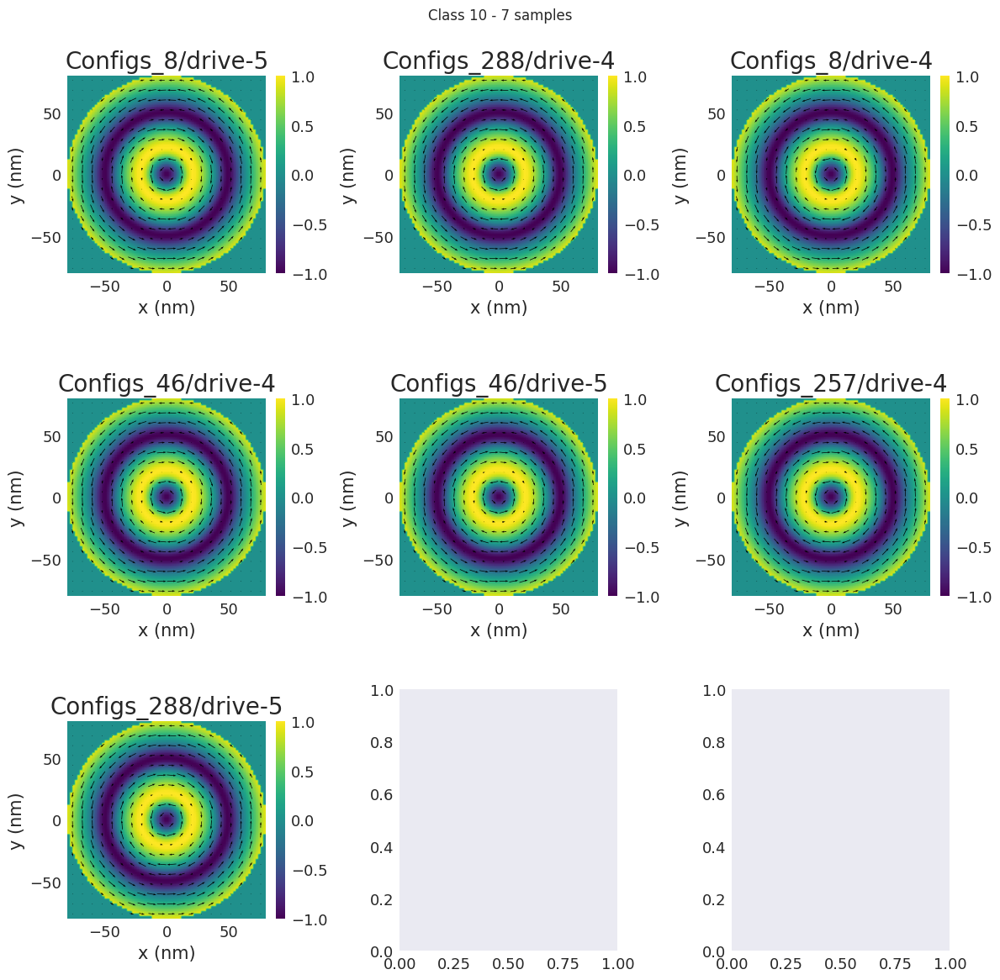

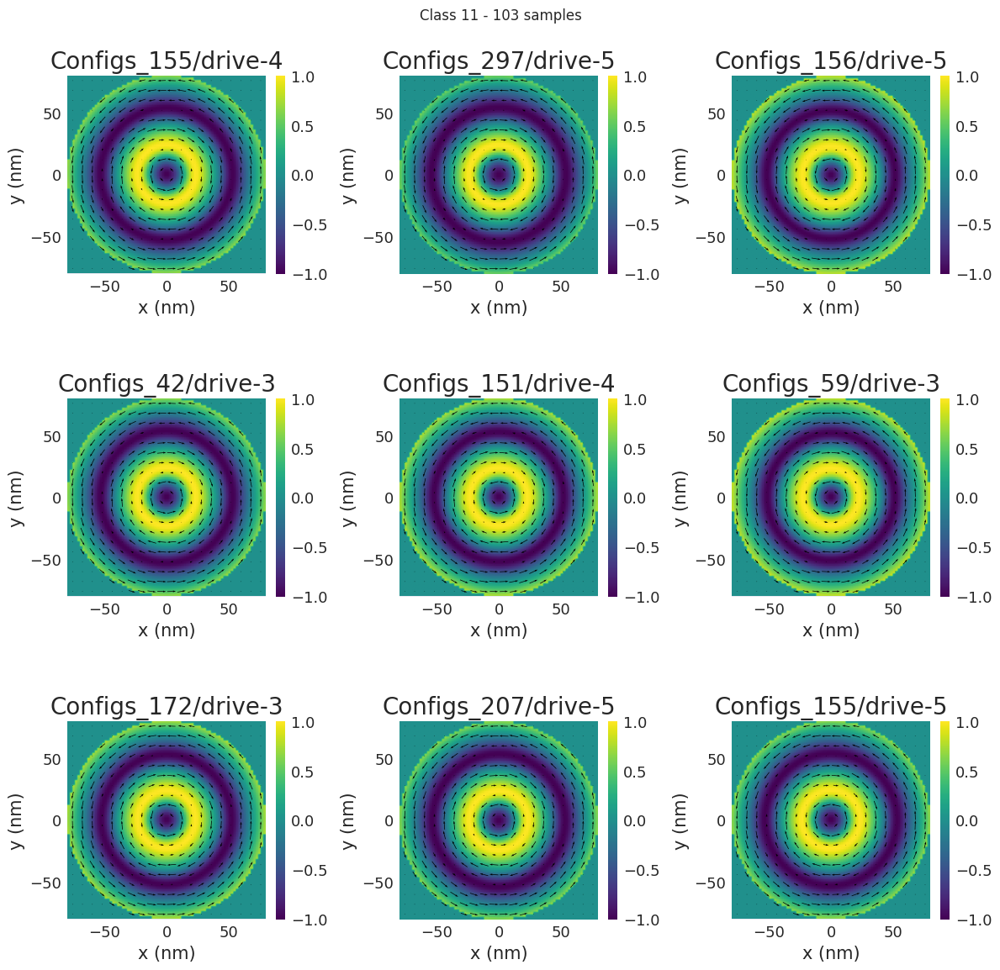

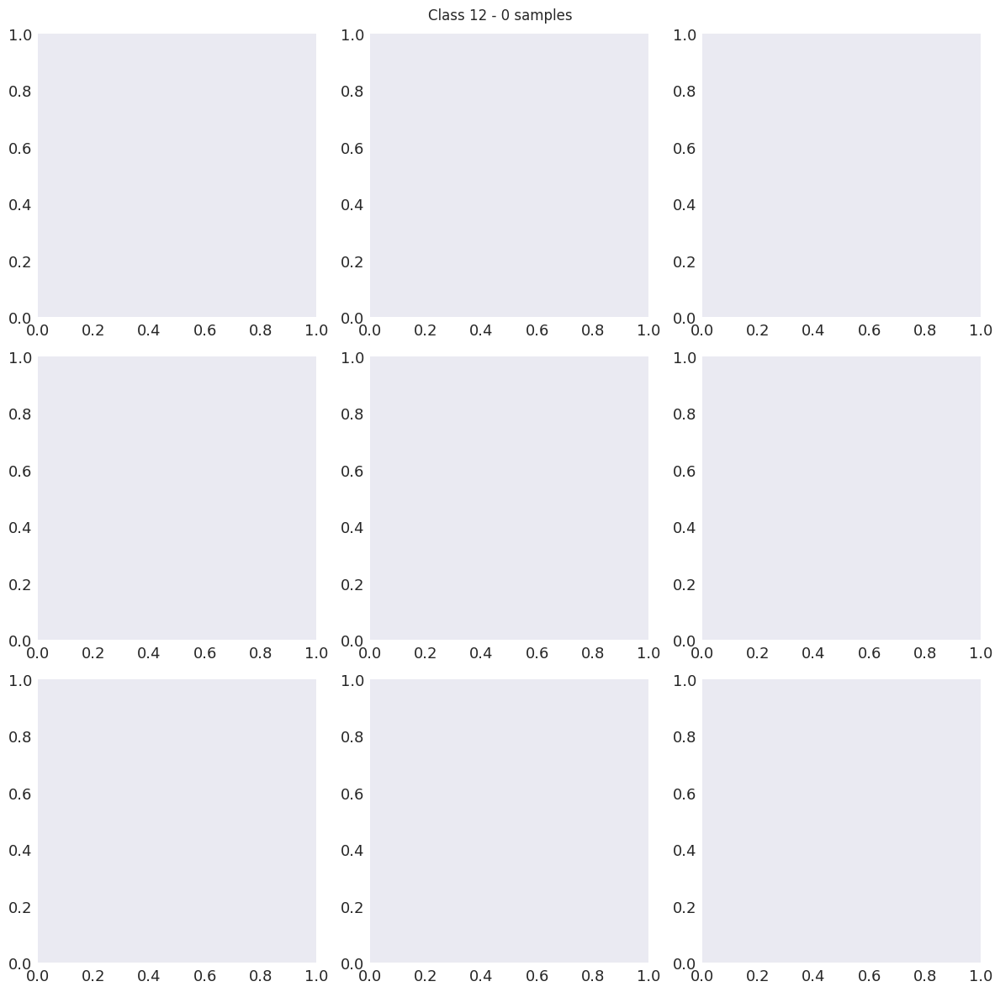

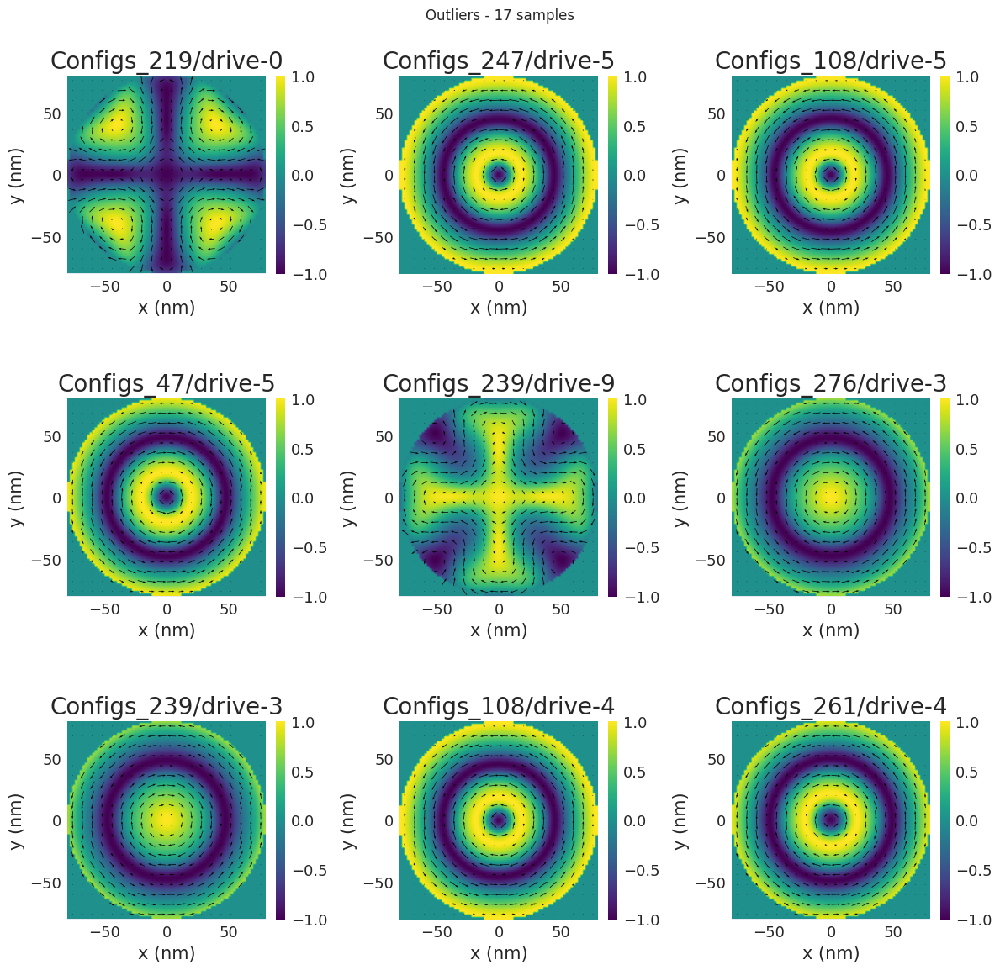

In [11]:
from plot import plot_all_examples

plot_all_examples(labels)